In [7]:
class ShapObject:
    
    def __init__(self, base_values, data, values, feature_names):
        self.base_values = base_values # Single value
        self.data = data # Raw feature values for 1 row of data
        self.values = values # SHAP values for the same row of data
        self.feature_names = feature_names # Column names

In [1]:
#@title Package import {display-mode: "form"}

import pandas as pd
import numpy as np
import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.inspection import PartialDependenceDisplay
import xgboost

import shap
import lime
import lime.lime_tabular
from lime import submodular_pick

from sklearn.metrics import accuracy_score
import operator

import matplotlib.pyplot as plt

np.random.seed(1)

**The prediction task** is to determine whether a person makes over 50K a year(i.e., >50K, <=50K).

* age: continuous.
* workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
* fnlwgt (final weight): continuous.

The weights are related to socio-economic characteristics.
People with similar demographic characteristics should have similar weights.  Since the CPS sample is actually a collection of 51 state samples, each with its own probability of selection, the statement only applies within state.

* education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
* education-num: continuous.
* marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
* occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
* relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
* race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
* sex: Female, Male.
* capital-gain: continuous.
* capital-loss: continuous.
* hours-per-week: continuous.
* native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

A detailed description is given on (the UCI page)[http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data].


In [2]:
dataset = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data', header=None, index_col=False,
                      names=["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status","Occupation", 
                             "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week", "Country", "Income"])
feature_names = dataset.columns[:-1]
dataset.head()

,Age,Workclass,fnlwgt,Education,Education-Num,Marital Status,Occupation,Relationship,Race,Sex,Capital Gain,Capital Loss,Hours per week,Country,Income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [3]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32561 non-null  int64 
 1   Workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   Education       32561 non-null  object
 4   Education-Num   32561 non-null  int64 
 5   Marital Status  32561 non-null  object
 6   Occupation      32561 non-null  object
 7   Relationship    32561 non-null  object
 8   Race            32561 non-null  object
 9   Sex             32561 non-null  object
 10  Capital Gain    32561 non-null  int64 
 11  Capital Loss    32561 non-null  int64 
 12  Hours per week  32561 non-null  int64 
 13  Country         32561 non-null  object
 14  Income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [4]:
# split data on features and labels encoded with integers
labels = dataset["Income"]
le = LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
dataset = dataset[feature_names].values

In [5]:
categorical_features = ['Workclass', 'Education', 'Marital Status', 'Occupation', 'Relationship', 'Race', 'Sex', 'Country']
categorical_features_indices = [1,3,5,6,7,8,9,13]

In [6]:
categorical_names = {}
for feature in categorical_features_indices:
    le = LabelEncoder()
    le.fit(dataset[:, feature])
    dataset[:, feature] = le.transform(dataset[:, feature])
    categorical_names[feature] = le.classes_

In [7]:
dataset = dataset.astype(float)

In [8]:
from sklearn.compose import ColumnTransformer 
encoder = ColumnTransformer([("enc", sklearn.preprocessing.OneHotEncoder(), categorical_features_indices)], remainder = 'passthrough')

In [9]:
np.random.seed(1)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(dataset, labels, train_size=0.80)

In [10]:
encoder.fit(dataset)
encoded_train = encoder.transform(train)

In [11]:
rf = RandomForestClassifier(n_estimators=100)
rf.fit(encoded_train, labels_train)
accuracy_score(labels_test, rf.predict(encoder.transform(test)))

0.8576692768309535

In [12]:
predict_fn = lambda x: rf.predict_proba(encoder.transform(x)).astype(float)

In [13]:
class0 = predict_fn(test)[:,0][labels_test==0]
false_0 = test[labels_test==0][np.argmin(class0)]
false_0_id = np.where((test == false_0).sum(axis=1) == 14)[0][0] # 417
true_0 = test[labels_test==0][np.argmax(class0)]
true_0_id = np.where((test == true_0).sum(axis=1) == 14)[0][0] # 1

class1 = predict_fn(test)[:,1][labels_test==1]
false_1 = test[labels_test==1][np.argmin(class1)]
false_1_id= np.where((test == false_1).sum(axis=1) == 14)[0][0] # 41
true_1 = test[labels_test==1][np.argmax(class1)]
true1_id= np.where((test == true_1).sum(axis=1) == 14)[0][0] # 381


In [14]:
true_0

array([1.80000e+01, 4.00000e+00, 2.08103e+05, 1.00000e+00, 7.00000e+00,
       4.00000e+00, 8.00000e+00, 2.00000e+00, 4.00000e+00, 1.00000e+00,
       0.00000e+00, 0.00000e+00, 2.50000e+01, 3.90000e+01])

In [15]:
feature_names

Index(['Age', 'Workclass', 'fnlwgt', 'Education', 'Education-Num',
       'Marital Status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital Gain', 'Capital Loss', 'Hours per week', 'Country'],
      dtype='object')

In [16]:
class_names

array([' <=50K', ' >50K'], dtype=object)

In [17]:
categorical_features_indices

[1, 3, 5, 6, 7, 8, 9, 13]

In [23]:
true_0

array([1.80000e+01, 4.00000e+00, 2.08103e+05, 1.00000e+00, 7.00000e+00,
       4.00000e+00, 8.00000e+00, 2.00000e+00, 4.00000e+00, 1.00000e+00,
       0.00000e+00, 0.00000e+00, 2.50000e+01, 3.90000e+01])

In [25]:
test[1, :]

array([1.80000e+01, 4.00000e+00, 2.08103e+05, 1.00000e+00, 7.00000e+00,
       4.00000e+00, 8.00000e+00, 2.00000e+00, 4.00000e+00, 1.00000e+00,
       0.00000e+00, 0.00000e+00, 2.50000e+01, 3.90000e+01])

In [27]:
explainer = lime.lime_tabular.LimeTabularExplainer(train,feature_names=feature_names,class_names=class_names,
                                                   categorical_features=categorical_features_indices, 
                                                   categorical_names=categorical_names)

In [28]:
n_explanations = 6

In [29]:
exp = explainer.explain_instance(true_0, predict_fn, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [30]:
np.random.seed(1)
exp = explainer.explain_instance(false_0, predict_fn, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [31]:
exp = explainer.explain_instance(true_1, predict_fn, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [32]:
exp = explainer.explain_instance(false_1, predict_fn, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [33]:
sp_obj = submodular_pick.SubmodularPick(explainer, train, predict_fn, sample_size=20, 
                                        num_features=10, num_exps_desired=n_explanations)

In [34]:
[exp.show_in_notebook(show_all=False) for exp in sp_obj.sp_explanations]

[None, None, None, None, None, None]

# SHAP

## Supported explainers
There are many different algorithms that can be used to estimate the Shapley values (and the related value for constrained games), each of these algorithms have various tradeoffs and are preferrable in different situations.

[shap.Explainer](https://github.com/slundberg/shap/blob/97ebd0c7bd8f1d2edde9769e784de45e55acfdb3/shap/explainers/_explainer.py#L19) is a basic method. You can set a particular algorithm that well be used, e.g., "permutation", "partition", "tree", "kernel", "sampling", "linear", "deep", or "gradient". By default, `algorithm = "auto", meaning that SHAP will try to make the best choice given the passed model and masker. It returns 

`masker` masker : function, numpy.array, pandas.DataFrame, tokenizer, None, or a list of these for each model input. The function used to "mask" out hidden features of the form `masked_args = masker(*model_args, mask=mask)`.
It takes input in the same form as the model, but for just a single sample with a binary mask, then returns an iterable of masked samples. These masked samples will then be evaluated using the model function and the outputs averaged, e.g., shap.ImageMasker for images and shap.TokenMasker for text, or shap.TabularMasker(data, hclustering="correlation") if the coalitions have a particular structure (in these case the Owen values well be used).


[shap.TreeExplainer](https://shap-lrjball.readthedocs.io/en/latest/generated/shap.TreeExplainer.html) is used to explain tree-based black-box models, e.g., those that computed by XGBoost, LightGBM, CatBoost, Pyspark and most tree-based scikit-learn models.
 
'shap.KernelExplainer' is another explainer that cab be applied to any black-box model. It can be a little bit slow, so use a model-specific one, if it exists.

An example of application: 
```explainer = shap.KernelExplainer(xgb_clf.predict_proba, shap.sample(train, 1000))```

```shap_values = explainer.shap_values(train[0])```




## Supported plots

You can plot a wide variety of Shapley-related plots. They are listed [here](https://shap.readthedocs.io/en/latest/api_examples.html#plots). We consider the most important ones.

In [23]:
nn = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(5, 2), 
                   random_state=0)
rforest = RandomForestClassifier(n_estimators=100, max_depth=None, 
                                 min_samples_split=2, random_state=0)
dtree = sklearn.tree.DecisionTreeClassifier(min_samples_split=2)
svc_rbf = sklearn.svm.SVC(kernel='rbf', probability=True)

xgb_clf = xgboost.XGBClassifier()

classifiers = [("Neural networks", nn), ("Random forests", rforest), ("Decision tree",dtree), ("SVM", svc_rbf)]
classifiers = [("Neural networks", nn), ("Random forests", rforest), ("Decision tree",dtree), ("XGBoost", xgb_clf)]

In [24]:
print("Model accuracies")
for name, clf in classifiers:
  clf.fit(train, labels_train)
  print("{1:20s} {0:.2f}".format(accuracy_score(labels_test, clf.predict(test)),name))

Model accuracies
Neural networks      0.77
Random forests       0.86
Decision tree        0.81
[21:43:05] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


XGBoost              0.87


### Explaining individual predictions

We consider the same instances as for LIME. Compare the importance of the attributes provided by LIME and SHAP.

In [25]:
# applying a TreeExplainer
#If “logloss” then we explain the log base e of the model loss function, so that the SHAP values sum up to the log loss of the model for each sample.
explainer = shap.TreeExplainer(xgb_clf)
shap_values = explainer.shap_values(test[[1, 41, 381, 417],:])

In [26]:
type(shap_values)

numpy.ndarray

In [27]:
# you can plot Shapley values for a single instance 
# true 0, id 1
rid, pid = (0, 1)
pred_label = xgb_clf.predict(test[[pid],:])[0]
print("True class {0:d}, predicted one is {1:d} (with P = {2:.2f})".format(labels_test[pid], 
      pred_label, xgb_clf.predict_proba(test[[pid],:])[0][pred_label]))
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rid], test[pid], feature_names=feature_names)

True class 0, predicted one is 0 (with P = 1.00)


In [28]:
rid, pid = (1, 41)
pred_label = xgb_clf.predict(test[[pid],:])[0]
print("True class {0:d}, predicted one is {1:d} (with P = {2:.2f})".format(labels_test[pid], 
      pred_label, xgb_clf.predict_proba(test[[pid],:])[0][pred_label]))
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rid], test[pid], feature_names=feature_names)

True class 1, predicted one is 0 (with P = 0.99)


In [29]:
rid, pid = (2, 381)
pred_label = xgb_clf.predict(test[[pid],:])[0]
print("True class {0:d}, predicted one is {1:d} (with P = {2:.2f})".format(labels_test[pid], 
      pred_label, xgb_clf.predict_proba(test[[pid],:])[0][pred_label]))
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rid], test[pid], feature_names=feature_names)

True class 1, predicted one is 1 (with P = 0.99)


In [30]:
rid, pid = (3, 417)
pred_label = xgb_clf.predict(test[[pid],:])[0]
print("True class {0:d}, predicted one is {1:d} (with P = {2:.2f})".format(labels_test[pid], 
      pred_label, xgb_clf.predict_proba(test[[pid],:])[0][pred_label]))
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rid], test[pid], feature_names=feature_names)

True class 0, predicted one is 1 (with P = 0.89)


We may also plot the Shapley values in the condenced form for all instances of a given dataset as it is done below.

In [31]:
# or for the whole dataset 
shap.initjs()

exp_array =  shap.sample(test, 100)
shap_values = explainer.shap_values(exp_array)
shap.force_plot(explainer.expected_value, shap_values, exp_array, feature_names=feature_names)

# Studing the feature importance

The plot below shows the Shapley values for features of a given dataset. The features are ordered by the sum of Shapley values starting from the largest one, i.e., by the attribute having the largest overall impact to the predictions.

The features like Race, Country, and Education are very close to 0, thus their Shapley values are almost 0's, and these features can be removed from the dataset.

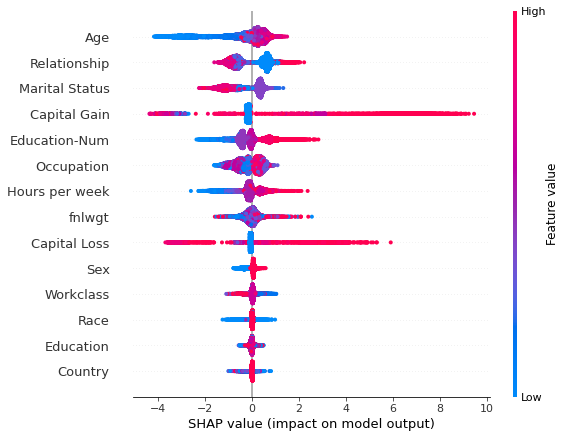

In [32]:
shap_values = explainer.shap_values(train)
shap.summary_plot(shap_values, train, feature_names)

The same information can plotted in a more "usual" way, i.e., as the "feature importance" plot.

The barplot shows the mean Shapley values. The later is similar to the standard feature importance provided by tree-based ensembles.

 99%|===================| 25863/26048 [00:49<00:00]        

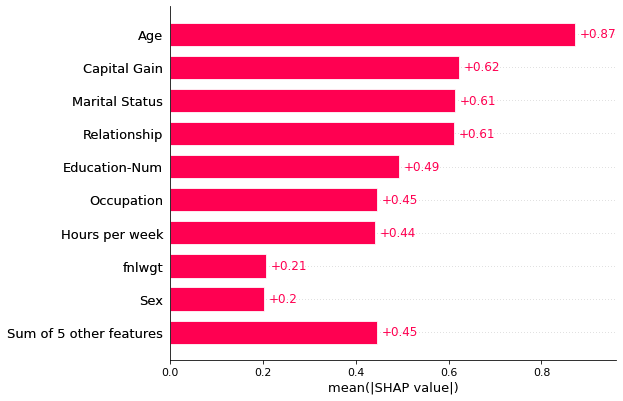

In [33]:
explainer = shap.Explainer(xgb_clf, train, feature_names=feature_names)
shap_values = explainer(train)
shap.plots.bar(shap_values)

In [34]:
type(shap_values)

shap._explanation.Explanation

Text(0.5, 1.0, 'XGB feature importance')

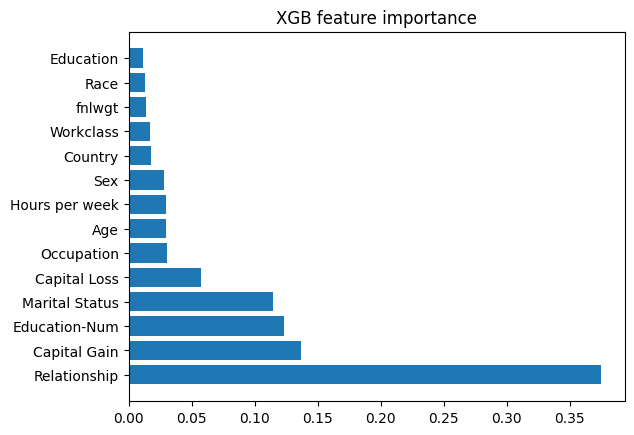

In [35]:
# feature importance for XGBoost classifier
fi = {n:v for n,v in zip(feature_names,xgb_clf.feature_importances_.T)}
sorted_fi = sorted(fi.items(), key=operator.itemgetter(1))

plt.rcdefaults()
fig, ax = plt.subplots()

ax.barh(range(len(sorted_fi)), [v[1] for v in sorted_fi], align='center')
ax.set_yticks(range(len(sorted_fi)))
ax.set_yticklabels([v[0] for v in sorted_fi])
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_title('XGB feature importance')


In [36]:
categorical_names[7]

array([' Husband', ' Not-in-family', ' Other-relative', ' Own-child',
       ' Unmarried', ' Wife'], dtype=object)

# A more detailed study of the features.

We may study how values of a given feature are related to their Shapley values by plotting the values of this feature and the corresponding Shapley values ([the details are here](https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/scatter.html#Customizing-the-figure-properties)).

Let us consider the age. The "vertical" dispersion, i.e., a range of the Shapley values for a given value of age says us about feature interactions: if the Shapley values do not vary, it means that there are non-linear interaction effects in the model between Age and other features

The light grey bars at the bottom show the distribution of the feature values.

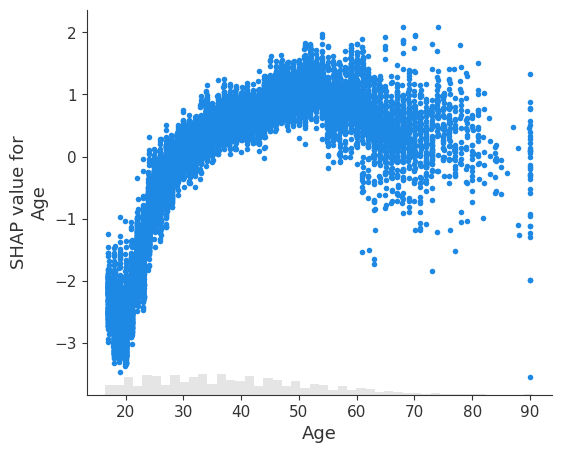

In [37]:
shap.plots.scatter(shap_values[:,"Age"])

To show which feature may be driving these interaction effects we can color our Age dependence scatter plot by another feature. If you pass the 'Explanation object' to the color parameter then the scatter plot attempts to pick out the feature column with the strongest interaction with Age. If an interaction effect is present between this other feature and the feature we are plotting it will show up as a distinct vertical pattern of coloring. For the example below, 20-year-olds with a high level of education are less likely make over \$50k than 20-year-olds with a low level of education. This suggests an interaction effect between Education-Num and Age.



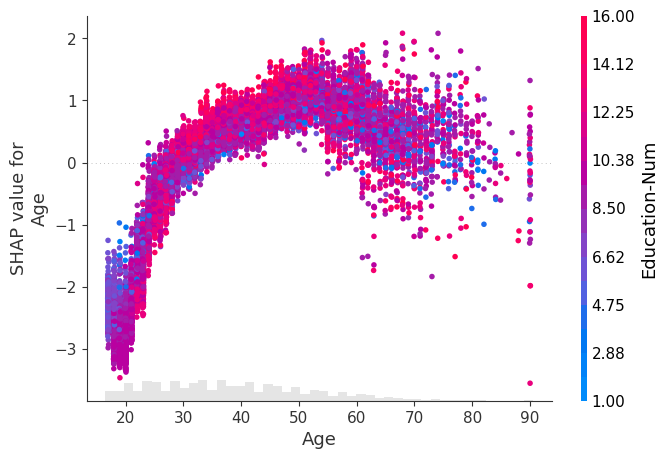

In [38]:
shap.plots.scatter(shap_values[:,"Age"], color=shap_values)

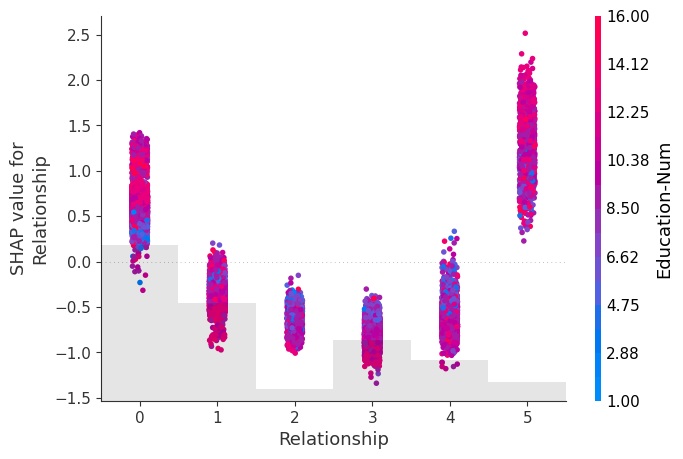

In [39]:
shap.plots.scatter(shap_values[:,"Relationship"], color=shap_values)